In [1]:
import os, sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import shutil
from pathlib import Path

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Loading packages

In [3]:
import sys
from pathlib import Path

here_path = Path().resolve()
repo_path = here_path.parents[1]
sys.path.append(str(repo_path))

In [4]:
from py.utils import verifyDir, verifyFile

In [5]:
from py.config import Config

cfg = Config()

np.random.seed(cfg.RANDOM_STATE)
cfg.DATA_PATH, cfg.MODEL_PATH

('/media/felipe/DATA19/datasets/', '/media/felipe/DATA19/models/')

In [6]:
QSCORE_PATH=f"{cfg.DATA_PATH}pp1/Qscores/"
IMAGES_PATH = f"{cfg.DATA_PATH}pp1/images/"

### Loading data

In [7]:
%%time
data_df = pd.read_csv(f"{QSCORE_PATH}scores.csv", sep=";", low_memory=False)
data_df["image_path"] = f"{IMAGES_PATH}/{cfg.YEAR_STUDIED}/" + data_df["image_path"]
if "CITY_STUDIED" in Config.model_fields:
    data_df = data_df[data_df["city"]==cfg.CITY_STUDIED].copy()
data_df["image_id"] = data_df["image_id"].apply(str)
data_df.sort_values(by=cfg.PERCEPTION_METRIC, inplace=True, ascending=False)

CPU times: user 4.13 ms, sys: 2.99 ms, total: 7.12 ms
Wall time: 6.79 ms


### City Studied

In [8]:
import glob

In [9]:
TOP_K = 25

#### High scores

In [10]:
top_k_images_path = data_df.iloc[:TOP_K]["image_path"].values

1 4196 8.32776568389
2 4189 8.32724143064
3 3527 8.24556093962
4 3656 8.01742046102
5 4254 7.99154927093
6 4083 7.96249488456
7 4117 7.74146349933
8 3708 7.70973159967
9 3720 7.59830138181
10 3999 7.48473908604
11 4122 7.43821902439
12 3725 7.38025899923
13 3538 7.30011869052
14 3582 7.29257238794
15 3601 7.26917183387
16 3583 7.26413350902
17 3781 7.21848920666
18 3655 7.13864234517
19 4133 7.12991329497
20 4081 7.11529321942
21 4207 7.11031496829
22 3830 7.09590578385
23 3765 7.09459878992
24 189 7.0894859044
25 3761 7.08510448181


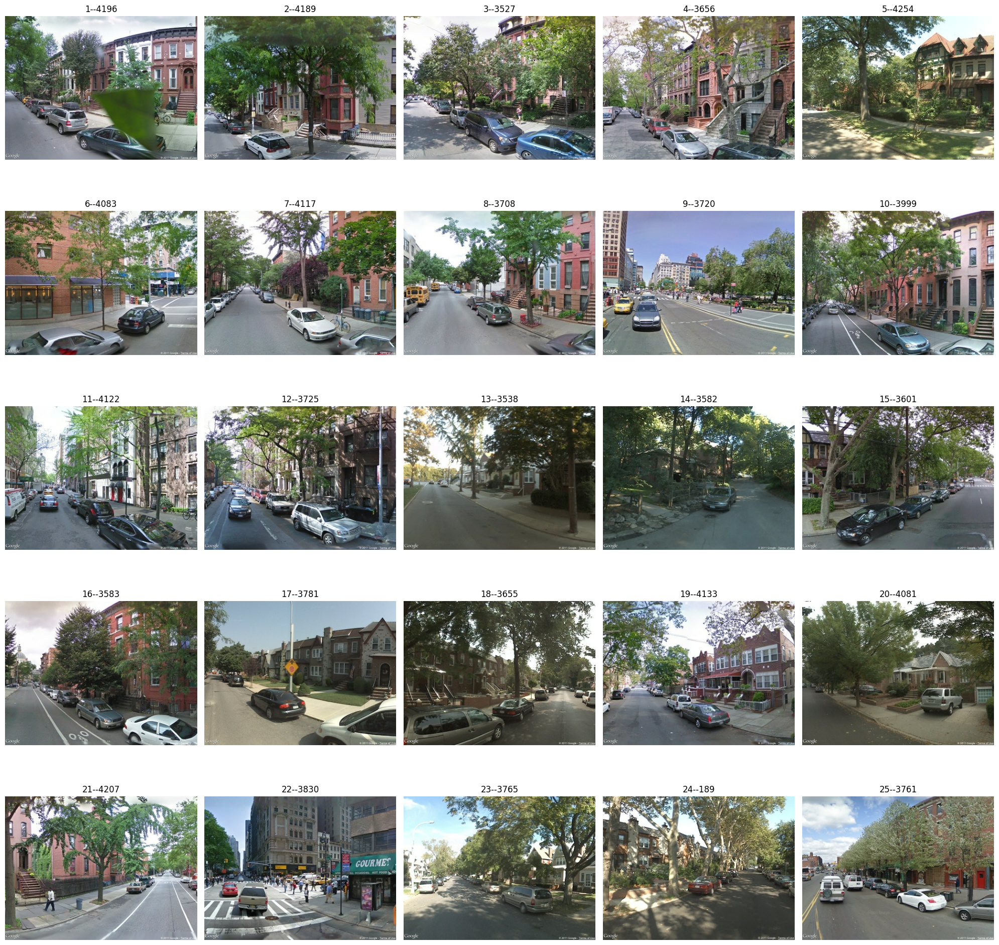

In [11]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Number of images
num_images = len(top_k_images_path)

# Create a figure with a 4x4 grid (adjust figsize as needed)
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Flatten the axes for easy iteration
axes = axes.ravel()

# Iterate over the images and plot them
for i in range(num_images):
    title = top_k_images_path[i].split("/")[-1].replace(".jpg", "")
    score = data_df[data_df["image_id"]==title][cfg.PERCEPTION_METRIC].values[0]
    print(i+1, title, score)
    img = mpimg.imread(top_k_images_path[i])  # Load the image
    axes[i].imshow(img)  # Show the image
    axes[i].set_title(f"{i+1}--{title}")
    axes[i].axis('off')  # Turn off the axis

# Adjust layout and display the grid of images
plt.tight_layout()
plt.show()

#### Low scores

In [12]:
bot_k_images_path = data_df.iloc[-TOP_K:]["image_path"].values

1 4251 1.5027745342
2 4197 1.49767495538
3 4036 1.49196195352
4 4084 1.4375733241
5 4282 1.42875179873
6 3834 1.33258780819
7 3641 1.32483561742
8 4068 1.31318231648
9 4204 1.29089493924
10 4061 1.28885120796
11 4094 1.18388020479
12 4048 1.18279734955
13 4290 1.13803148879
14 4034 1.08827335404
15 3597 0.983918172048
16 4141 0.952937350229
17 4179 0.941343791964
18 3861 0.82922429128
19 3536 0.821258065948
20 4137 0.818342814209
21 3498 0.797571302268
22 3896 0.773926712874
23 3520 0.762054801835
24 4162 0.465477281664
25 4074 0.211543520683


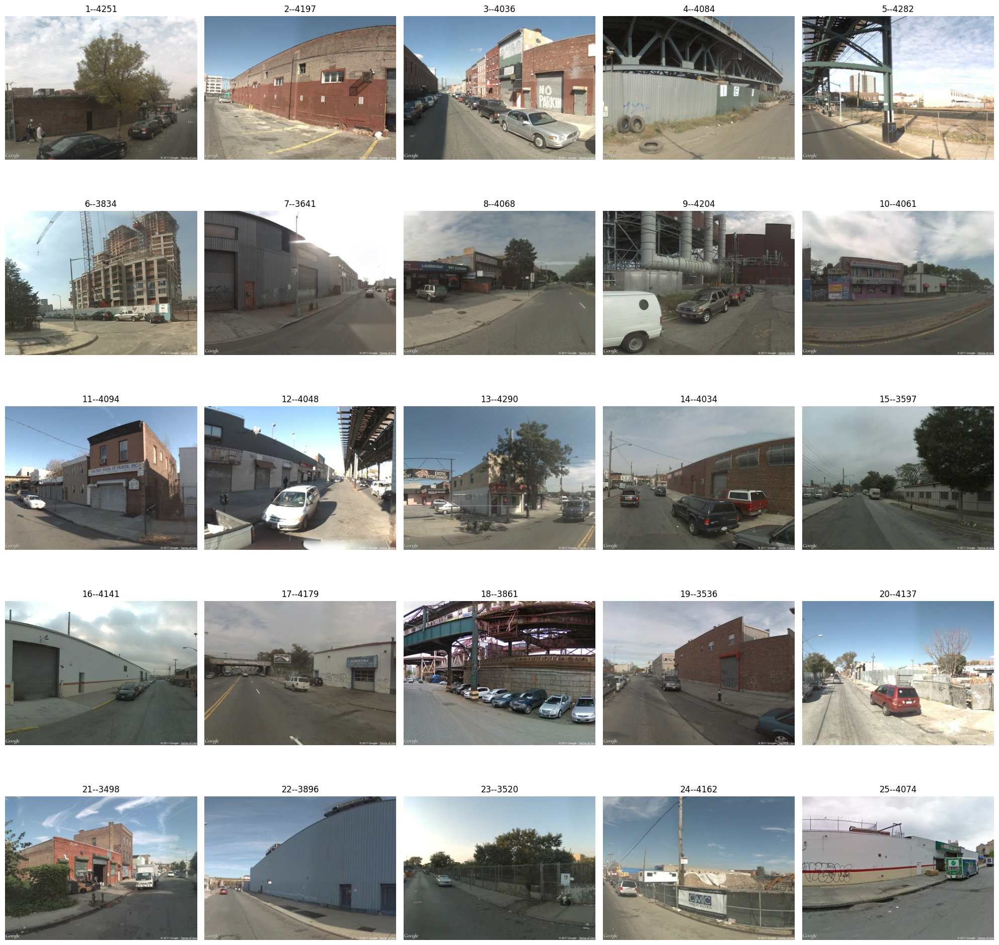

In [13]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Number of images
num_images = len(bot_k_images_path)

# Create a figure with a 4x4 grid (adjust figsize as needed)
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Flatten the axes for easy iteration
axes = axes.ravel()

# Iterate over the images and plot them
for i in range(num_images):
    title = bot_k_images_path[i].split("/")[-1].replace(".jpg", "")
    score = data_df[data_df["image_id"]==title][cfg.PERCEPTION_METRIC].values[0]
    print(i+1, title, score)
    img = mpimg.imread(bot_k_images_path[i])  # Load the image
    axes[i].imshow(img)  # Show the image
    axes[i].set_title(f"{i+1}--{title}")
    axes[i].axis('off')  # Turn off the axis

# Adjust layout and display the grid of images
plt.tight_layout()
plt.show()